In [1]:
from torch.utils.data import DataLoader
from torch.utils.data import TensorDataset
import torch.nn as nn
import numpy as np
import torch
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [2]:
#device : GPU or CPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = torch.device("cpu")
print(device)

cpu


## 准备数据

In [3]:
import scipy.io as sio
namex="k1"
namey="k2"
x = sio.loadmat("figure2mat/mat/"+namex+".mat")['b']
y = sio.loadmat("figure2mat/mat/"+namey+".mat")['b']

theta = np.linspace(0,2*np.pi,len(x))


In [4]:
# 插值
from scipy import interpolate
NK = len(x)*10
theta_new = np.linspace(0,2*np.pi,NK)
x_new, y_new = np.zeros([NK,3]), np.zeros([NK,3])
for f,f_new in zip([x,y],[x_new,y_new]):
    for i in range(3):
        intf = interpolate.interp1d(theta, f[:,i])
        f_new[:,i] = intf(theta_new)
theta,x,y = theta_new, x_new, y_new


In [5]:
x.shape,y.shape

((2560, 3), (2560, 3))

## 画图代码

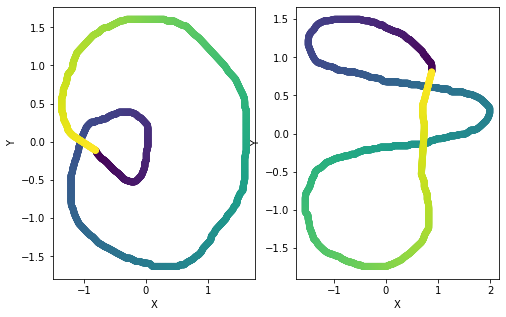

In [6]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

def plot_knot(x, sub=111,dim=2,figsize=None):
    if sub%10==1:
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(sub,projection='3d' if dim==3 else None)        
    else:
        ax = plt.subplot(sub,projection='3d' if dim==3 else None)
        
    if dim==3:
        ax.scatter(x[:,0],x[:,1],x[:,2],c=np.linspace(0,2*np.pi,len(x))) # ax.scatter(x1,x2,x3,c=theta)
    else:
        plt.scatter(x[:,0],x[:,1],c=np.linspace(0,2*np.pi,len(x))) # ax.scatter(x1,x2,x3,c=theta)
    #L = 1.1; ax.set_xlim(-L*np.min(x[0]), L); ax.set_ylim(-L, L); ax.set_zlim(-L, L)
    ax.set_xlabel('X'); ax.set_ylabel('Y'); #ax.set_zlabel('Z');

plot_knot(x,121,figsize=[8,5])
plot_knot(y,122)

In [25]:
# import plotly.plotly as py
import plotly
import plotly.graph_objs as go
import plotly.express as px

def plotly_knot(X,nameX):
    name="predictnet/"+nameX+".html"#HTML名称
    
    trace = go.Scatter3d(
        x=X[:,0], y=X[:,1], z=X[:,2],
        marker=dict(
            size=4,
            #color=z,
            colorscale='Viridis',
        ),
        #mode='lines',
        mode='markers',
        line=dict(
            #color='#1f77b4',
            color=X[:,0],
            width=10
        ),
        name='Scatter3d'
    )
    data = [trace]
#     plotly.offline.plot(data,filename=name) # iplot, i.e. 'plotly_temp.html'
#     go.Figure(data).show()
    fig = px.line_3d(x=X[:,0], y=X[:,1], z=X[:,2])
    fig.add_trace(trace)
    fig.show()
    if name is not None:
        plotly.offline.plot(fig,filename=name)

In [8]:
# 第一个结的形状
plotly_knot(x,namex)

In [9]:
# 第二个结的形状
plotly_knot(y,namey)

## Pytorch 

### model

#### Net1

In [10]:
class Act_op(nn.Module):
    def __init__(self):
        super(Act_op, self).__init__()
 
    def forward(self, x):
        #x = x * F.sigmoid(x)
        #return x + torch.exp(-x**2/2)
        return x + 1/(1+x**2)

class Net1(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        layers = [nn.Linear(in_features=3,out_features=3)]
        for i in range(30):
            #layers.append(nn.Tanh())
            layers.append(Act_op())#激活函数
            layers.append(nn.Linear(3,3))#全连接层
            layers.append(nn.BatchNorm1d(3))#批标准化
            
        self.net = nn.Sequential(*layers)#神经网络顺序容器

    def forward(self, input:torch.FloatTensor):#前馈神经网络
        return self.net(input)

#### Net2

In [11]:
class BasicNet(nn.Module): # for st
    def __init__(self,width=30,nblock=2):
        super(BasicNet, self).__init__()
        layers = [nn.Linear(in_features=3,out_features=width)]
        for i in range(nblock):
 #           layers.append(nn.Tanh())
            layers.append(nn.ReLU6())
            layers.append(nn.Linear(width,width))
            layers.append(nn.BatchNorm1d(width))
            
        layers.append(nn.Linear(width,2*3))
        
        self.net = nn.Sequential(*layers)

    def forward(self, input:torch.FloatTensor):
        return self.net(input)
    
class CouplingLayer(nn.Module):
    def __init__(self,imask = 0):
        super(CouplingLayer, self).__init__()
        
#       self.st_net = BasicNet(width=100,nblock=3)
        self.st_net = BasicNet(width=10,nblock=5)
        self.rescale = nn.Parameter(torch.zeros(3))
        masks = 1-np.eye(3)
        self.b = torch.tensor(masks[imask], dtype=torch.float32, device=device, requires_grad=False)
 
    def forward(self, x):
        
        b = self.b
        x_b = x * self.b
        
        st = self.st_net(x_b)
        st = torch.tanh(st)
        s, t = st.chunk(2, dim=1)
        

        es = 1 - 1 / (1+s**2)
#        es = es * (self.rescale**2 + 1e-4)
#        es = es * torch.exp(self.rescale)
        
        
        return b * x + (1-b) * ( x * es + t)

class Net2(nn.Module):
    def __init__(self):
        super(Net2, self).__init__()
        layers = [nn.Linear(in_features=3,out_features=3)]
        for i in range(1):
            layers.append(CouplingLayer(0))
            layers.append(nn.Linear(3,3))
            layers.append(CouplingLayer(1))
            layers.append(nn.Linear(3,3))
            layers.append(CouplingLayer(2))
            layers.append(nn.Linear(3,3))
            
        self.net = nn.Sequential(*layers)

    def forward(self, input:torch.FloatTensor):
        return self.net(input)

#### set

In [12]:
# Net = Net1
Net = Net2

net = Net()
if Net is Net1:
    for key in net.state_dict().keys():
        if 'weight' in key and len(net.state_dict()[key].shape)==2:
    #         nn.init.normal_(net.state_dict()[key], mean=0, std=1)
            nn.init.orthogonal_(net.state_dict()[key], gain=1)#二维张量转化为稀疏矩阵

optim = torch.optim.Adam(Net.parameters(net),lr=0.001)
# Adam(Adaptive Moment Estimation)本质上是带有动量项的RMSprop，它利用梯度的一阶矩估计和二阶矩估计动态调整每个参数的学习率。
# 它的优点主要在于经过偏置校正后，每一次迭代学习率都有个确定范围，使得参数比较平稳。
Loss = nn.MSELoss()#均方误差损失函数

### train

In [13]:
# 做成数据集，使用批训练方式
dataset = TensorDataset(torch.tensor(x,dtype=torch.float),torch.tensor(y,dtype=torch.float))
dataloader = DataLoader(dataset,batch_size=512,shuffle=True)

In [14]:
net.to(device)
x_array = []
loss_history = []

In [15]:
# 下面开始训练：
def study(n):
    for epoch in range(n):

        loss=None
        for batch_x,batch_y in dataloader:
            y_predict=net(batch_x.to(device))
            loss = Loss(y_predict,batch_y.to(device))
            optim.zero_grad()
            loss.backward()
            optim.step()

        if loss.item() < 0.004:
            break

        # 每1000次 的时候打印一次日志
        if (epoch+0)%1000==0:
            print("step: {0} , loss: {1}".format(epoch+1,loss.item()))

        loss_history.append(loss.item())


        predict = net(torch.tensor(x,dtype=torch.float).to(device))
        x_array.append(predict.cpu().detach().numpy())

In [16]:
study(40000)

step: 1 , loss: 0.8265311121940613


In [17]:
study(40000)

step: 1 , loss: 0.006475040223449469


In [18]:
torch.save(net.state_dict(), "predictnet/"+namex+"to"+namey+".pkl")   # 只保存网络中的参数 (速度快, 占内存少)
# torch.save(net.state_dict(), 'net_cyw/0423-s14tos15-cyw-01.pkl')   # 只保存网络中的参数 (速度快, 占内存少)

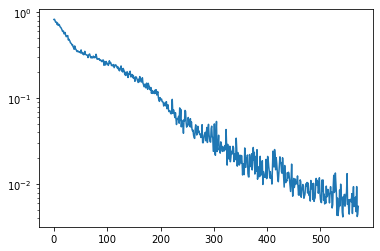

In [19]:
# loss函数趋势图
plt.semilogy(loss_history);

### plot

In [20]:
# net.load_state_dict(torch.load('net2-st=tanh-width=30-range1(0.08).pkl')) # 调用该网络

In [21]:
# 使用训练好的模型进行预测
predict = net(torch.tensor(x,dtype=torch.float).to(device))

In [22]:
# 定义筛除异常点的函数
def get_mse(records_real, records_predict):
    mse=[]
    for i in range(len(records_real)):
        mse.append(np.sqrt(np.sum([(x - y) ** 2 for x, y in zip(records_real[i], records_predict[i])])))
    return mse


def delete(records_real,records_predict,delta):
    mse=get_mse(records_real,records_predict)
    print(len(records_real))
    de=[i for i in range(1,len(records_real)-1)if mse[i]>delta]
    print(len(de))
    records_real=np.delete(records_real,de,0)
    return records_real

X=predict.cpu().detach().numpy()
X=delete(X,y,0.12)
len(X)

2560
322


2238

In [26]:
# plot_knot(predict.cpu().detach().numpy())
plotly_knot(predict.cpu().detach().numpy(),namex+"to"+namey)

# 插值

In [28]:
plotly_knot(X,namex+"to"+namey+"(interpolate)")#插值前的图像

In [ ]:
# Gamma_array = []
# out = torch.tensor(x,dtype=torch.float).to(device)
# for layer in list(net.net):
#     out = layer(out)
#     Gamma_array.append(out.cpu().detach().numpy())
# # print(out)

In [ ]:
# plot_knot(Gamma_array[-1],121,figsize=[8,5])
# plot_knot(y,122)

In [29]:
# 进行插值
from scipy import interpolate
NK = len(X)*10
theta_new = np.linspace(0,2*np.pi,NK)
X_new=np.zeros([NK,3])
f=X
f_new=X_new
for i in range(3):
    intf = interpolate.interp1d(np.linspace(0,2*np.pi,len(X)), f[:,i])
    f_new[:,i] = intf(theta_new)
X=X_new

In [30]:
# 插值后的长度
len(X)

22380

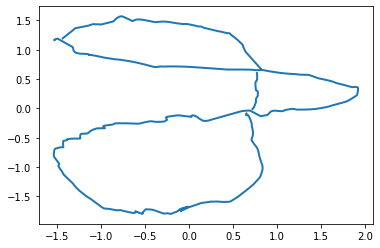

In [35]:
# 绘制纽结图
from ploot import knot2figure
knot2figure(X,x)

In [36]:
plotly_knot(X,namex+"to"+namey+"(final)")# 保存该图像为HTML